# 03_Histology_segmentation

Maynard 2020 protocol: 
>Histology images were processed and nuclei were segmented using the Color-Based Segmentation using K-Means Clustering in Matlab v.R2019a. The Matlab function rgb2lab is used to convert the image from **RGB color space to CIELAB color space**, also called L*a*b color space (L, luminosity layer measures lightness from black to white; a, chromaticity layer measures color along red–green axis; and b, chromaticity layer measures color along blue–yellow axis). The CIELAB color space quantifies the visual differences caused by the different colors in the image. The **a*b color space is extracted from the L*a*b-converted image** and is given to the K-means clustering function imsegkmeans, along with the number of colors the user visually identifies in the image. The imsegkmeans outputs a binary mask for each color that it identifies. As the nuclei in the histology images have a bright color that can be easily differentiated from the background, a binary mask generated for the nuclei color is used as the nuclei segmentation.
>
>The segmented binary mask was used to estimate the number of nuclei in each spot. For each histology image, there is a JSON file describing some properties of the image, including the spot diameter in pixels at the full-resolution image. In addition, for each image there is a text file in tabular format that includes one row for each spot with an identification barcode, a row, a column and pixel coordinates for the center of the spot on the full-resolution image. Using this information, the following protocol was implemented: for each spot, all pixels of the binary mask were set to zero except those within the spot radius of the center of that spot. The resulting binary mask was then labeled with a unique integer for each unique contiguous cluster of pixels. The maximum of this labeled mask was stored as an estimate of the number of nuclei within that spot.

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [2]:
im_fn = 'data/151673_tissue_hires_image.png'

In [6]:
im_frame = Image.open(im_fn)
np_frame = np.array(im_frame.getdata())

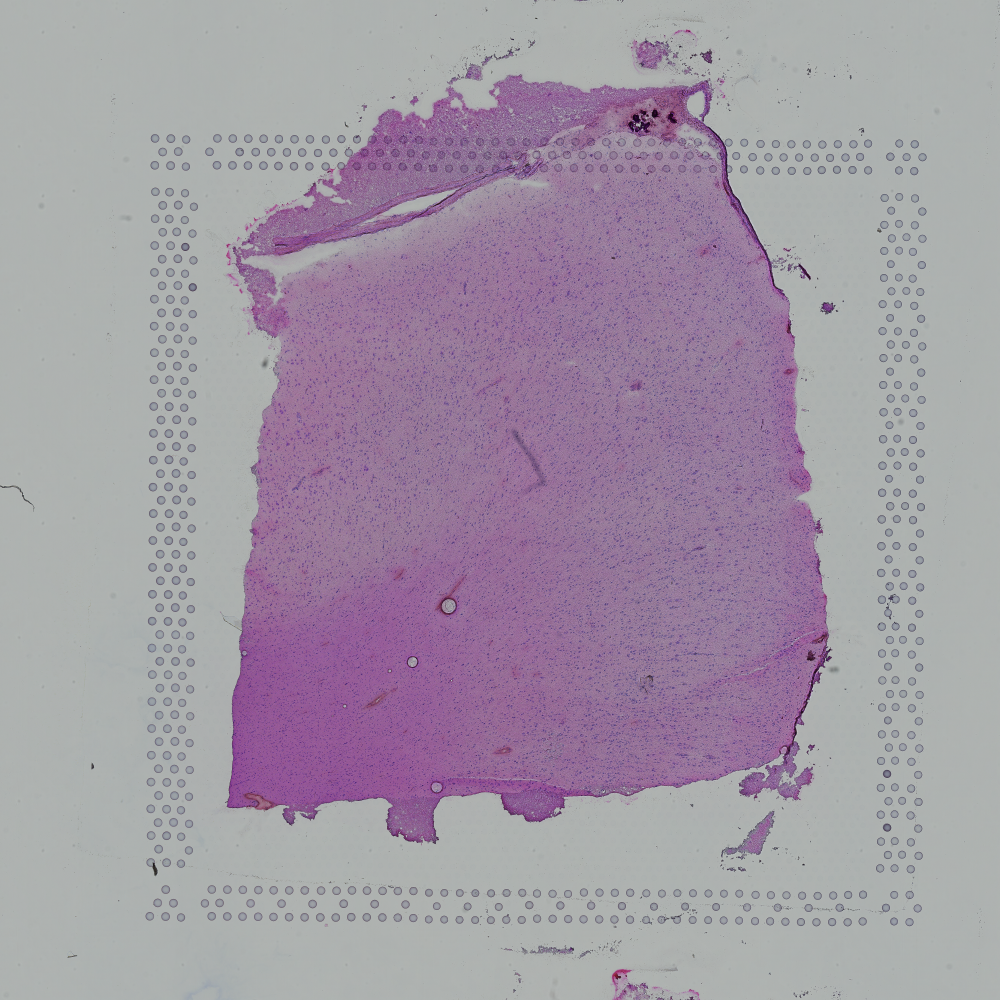

In [9]:
display(im_frame)

In [10]:
np_frame

array([[174, 178, 177],
       [174, 177, 176],
       [173, 178, 176],
       ...,
       [173, 179, 176],
       [174, 178, 176],
       [174, 178, 176]])

In [12]:
from PIL import Image, ImageCms

# Convert to Lab colourspace
srgb_p = ImageCms.createProfile("sRGB")
lab_p  = ImageCms.createProfile("LAB")

rgb2lab = ImageCms.buildTransformFromOpenProfiles(srgb_p, lab_p, "RGB", "LAB")
Lab = ImageCms.applyTransform(im_frame, rgb2lab)

In [17]:
L, a, b = Lab.split()

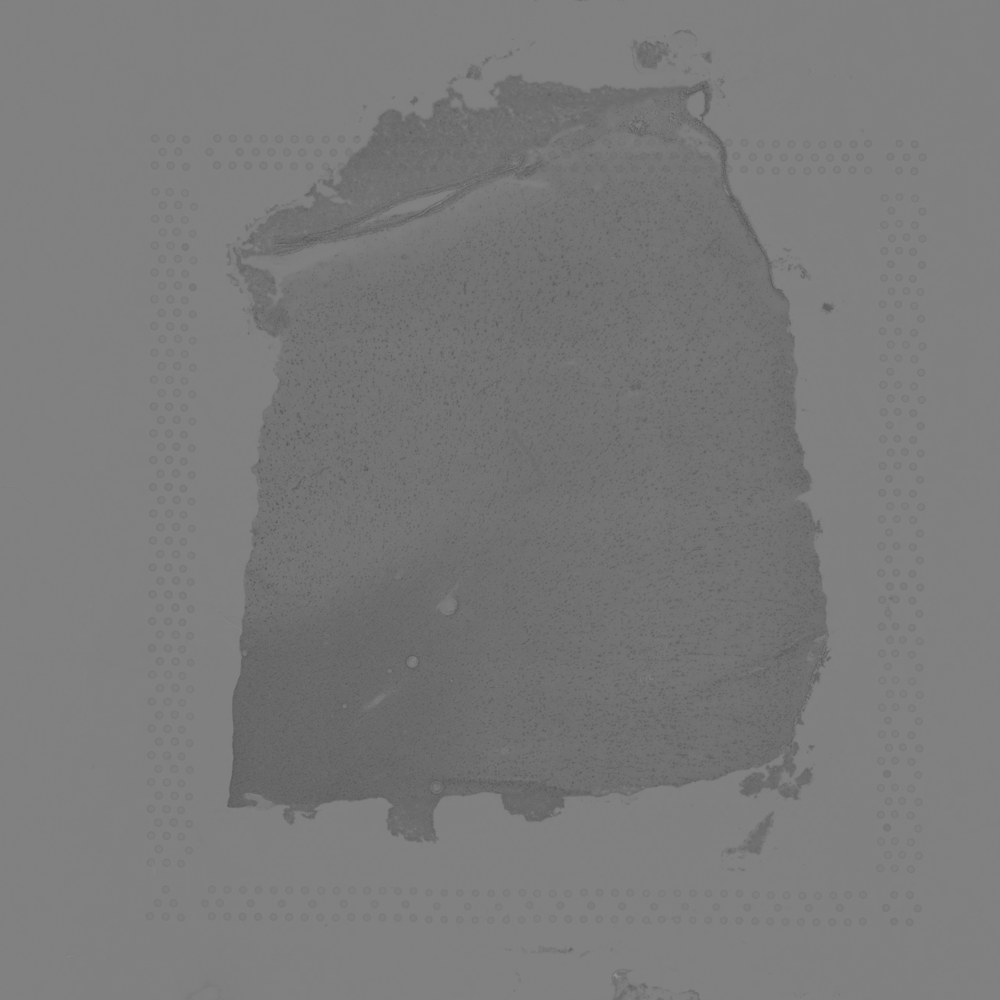

In [20]:
b

In [21]:
import sklearn

In [ ]:
sklearn.cluster.KMeans(a * b)